# <center>DataDive: Housing Insecurity</center>
<hr>

# Installation

- python>=3.80
- pandas==1.3.0
- nump==1.20.3
- matplotlib==3.3.4
- plotly==5.3.1
- json==2.0.9
- ipywidgets==7..6.3

Apart from these dependencies, some additional setup might be required to display the plotly graphs depending on your environment. For example this notebook was created using JupyterLab which requires install `jupyterlab` (version 3.0.16 in this case) to display the visuals as discussed here https://plotly.com/python/getting-started/#jupyterlab-support.

In [1]:
# Load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import json

# magic commands
%matplotlib inline
%load_ext nb_black
%load_ext lab_black

<IPython.core.display.Javascript object>

In [2]:
# !pip install jupyter-dash

<IPython.core.display.Javascript object>

In [3]:
# Change display options to prevent truncation of rows and columns
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

<IPython.core.display.Javascript object>

In [4]:
# Load Dataset
df = pd.read_csv("./hillsborough_fl_processed_2017_to_2019_20210916.csv")

<IPython.core.display.Javascript object>

In [5]:
df.head()

,census_tract_GEOID,total-households,total-renter-occupied-households,total-owner-occupied-households,total-owner-occupied-households-mortgage,median-gross-rent,median-household-income,median-property-value,median-monthly-housing-cost,pct-white,pct-af-am,pct-hispanic,pct-am-indian,pct-asian,pct-nh-pi,pct-multiple,pct-other,pct-below-poverty-level,households-children,single-parent-household,older-adult-alone,level-of-education,immigrant-status,english-fluency,drive-to-work,public-transport-to-work,vacant-properties,live-in-mobile-home,pct-renter-occupied,pct-owner-occupied,pct-owner-occupied-mortgage,pct-owner-occupied-without-mortgage,median-house-age,pct-non-white,pct-without-health-insurance,total-evictions,avg-evictions,total-foreclosure-sales,avg-foreclosure-sales,total-lien-foreclosures,avg-lien-foreclosures,total-evictions-2017,eviction-filings-2017,eviction-rate-2017,total-evictions-2018,eviction-filings-2018,eviction-rate-2018,total-evictions-2019,eviction-filings-2019,eviction-rate-2019,foreclosure-sales-2017,foreclosure-sales-2018,foreclosure-sales-2019,lien-foreclosures-2017,lien-foreclosures-2018,lien-foreclosures-2019,avg-foreclosure-rate,foreclosure-rate-2017,foreclosure-rate-2018,foreclosure-rate-2019,avg-lien-foreclosure-rate,lien-foreclosure-rate-2017,lien-foreclosure-rate-2018,lien-foreclosure-rate-2019,avg-eviction-rate,ratio-to-mean-foreclosure-rate,ratio-to-mean-eviction-rate,avg-housing-loss-rate,evictions-pct-total-housing-loss,housing-loss-index,county_GEOID,county,state
0,12057000401,926,338,588,432,1055,48426,148200,1172,669,155,207,0,15,27,52,8,-888888888,124,21,172,137,78,1805,996,106,48,20,36.501080,63.498920,46.652268,16.846652,55,-569,12.961567,49.479798,16.493266,6.0,2.000000,NaN,NaN,19.893939,39.0,0.510101,12.752525,25.0,0.510101,16.833333,33.0,0.510101,4.0,1.0,1.0,NaN,NaN,NaN,0.462963,0.925926,0.231481,0.231481,NaN,NaN,NaN,NaN,4.879664,0.655993,2.154130,2.401723,0.891853,1.583222,12057,Hillsborough County,Florida
1,12057010105,1496,381,1115,653,879,53860,232000,1549,1431,8,242,18,15,0,0,24,-888888888,325,19,206,143,322,3130,1414,0,146,658,25.467914,74.532086,43.649733,30.882353,33,-1331,13.405495,18.428571,6.142857,14.0,4.666667,1.0,1.0,9.428571,22.0,0.428571,3.000000,7.0,0.428571,6.000000,14.0,0.428571,5.0,6.0,3.0,0.0,1.0,0.0,0.714650,0.765697,0.918836,0.459418,0.089686,0.0,0.089686,0.000000,1.612298,1.012621,0.711750,1.045408,0.568282,0.689136,12057,Hillsborough County,Florida
2,12057010203,766,395,371,197,846,39018,96500,1155,524,212,54,4,14,0,12,0,-888888888,40,28,115,46,49,1674,701,7,126,229,51.566580,48.433420,25.718016,22.715405,42,-424,22.698413,60.202532,20.067511,12.0,4.000000,2.0,1.0,22.316456,43.0,0.518987,10.898734,21.0,0.518987,26.987342,52.0,0.518987,2.0,3.0,7.0,0.0,1.0,1.0,2.030457,1.015228,1.522843,3.553299,0.269542,0.0,0.269542,0.269542,5.080382,2.877047,2.242737,4.065458,0.833801,2.679961,12057,Hillsborough County,Florida
3,12057010600,1108,354,754,481,1095,80600,234300,1584,817,225,186,18,0,0,39,9,-888888888,244,19,136,133,321,2342,1285,24,110,0,31.949458,68.050542,43.411552,24.638989,59,-717,9.465021,106.240000,35.413333,8.0,2.666667,NaN,NaN,37.626667,68.0,0.553333,34.306667,62.0,0.553333,34.306667,62.0,0.553333,2.0,1.0,5.0,NaN,NaN,NaN,0.554401,0.415800,0.207900,1.039501,NaN,NaN,NaN,NaN,10.003766,0.785556,4.416168,4.560479,0.929972,3.006280,12057,Hillsborough County,Florida
4,12057002300,1419,599,820,592,1138,62636,212600,1400,1159,184,179,0,11,0,36,29,-888888888,213,46,223,209,159,2794,1450,30,124,34,42.212826,57.787174,41.719521,16.067653,72,-1059,10.792476,17.297297,5.765766,13.0,4.333333,1.0,1.0,3.243243,6.0,0.540541,4.324324,8.0,0.540541,9.729730,18.0,0.540541,8.0,2.0,3.0,0.0,1.0,0.0,0.731982,1.351351,0.337838,0.506757,0.121951,0.0,0.121951,0.000000,0.962565,1.037179,0.424925,0.847951,0.570919,0.558972,12057,Hillsborough County,Florida


<IPython.core.display.Javascript object>

In [6]:
df.columns

Index(['census_tract_GEOID', 'total-households',
       'total-renter-occupied-households', 'total-owner-occupied-households',
       'total-owner-occupied-households-mortgage', 'median-gross-rent',
       'median-household-income', 'median-property-value',
       'median-monthly-housing-cost', 'pct-white', 'pct-af-am', 'pct-hispanic',
       'pct-am-indian', 'pct-asian', 'pct-nh-pi', 'pct-multiple', 'pct-other',
       'pct-below-poverty-level', 'households-children',
       'single-parent-household', 'older-adult-alone', 'level-of-education',
       'immigrant-status', 'english-fluency', 'drive-to-work',
       'public-transport-to-work', 'vacant-properties', 'live-in-mobile-home',
       'pct-renter-occupied', 'pct-owner-occupied',
       'pct-owner-occupied-mortgage', 'pct-owner-occupied-without-mortgage',
       'median-house-age', 'pct-non-white', 'pct-without-health-insurance',
       'total-evictions', 'avg-evictions', 'total-foreclosure-sales',
       'avg-foreclosure-sales', 

<IPython.core.display.Javascript object>

We can see above that some columns have year wise values, whereas some columns are aggregations / don't have year wise values.

We will create 2 csv files with Year and without Year wise features which can be connected using 'census_tract_GEOID'

### Creating Non-Year CSV

In [7]:
df_non_year = df[[x for x in df.columns if "2" not in x]]

<IPython.core.display.Javascript object>

In [8]:
# Exporting CSV
df_non_year.to_csv("./Hillsborough Aggregate Stats.csv", index=False)

<IPython.core.display.Javascript object>

### Creating Year wise CSV

This csv contains columns which have year wise data in a cleaner format to use for visualizations

In [9]:
df_year = df[["census_tract_GEOID"] + [x for x in df.columns if "2" in x]]

<IPython.core.display.Javascript object>

In [10]:
# We melt this down to get year wise rates for each columns and make these easier to work with in Visualization Tools
df_year.head()

,census_tract_GEOID,total-evictions-2017,eviction-filings-2017,eviction-rate-2017,total-evictions-2018,eviction-filings-2018,eviction-rate-2018,total-evictions-2019,eviction-filings-2019,eviction-rate-2019,foreclosure-sales-2017,foreclosure-sales-2018,foreclosure-sales-2019,lien-foreclosures-2017,lien-foreclosures-2018,lien-foreclosures-2019,foreclosure-rate-2017,foreclosure-rate-2018,foreclosure-rate-2019,lien-foreclosure-rate-2017,lien-foreclosure-rate-2018,lien-foreclosure-rate-2019
0,12057000401,19.893939,39.0,0.510101,12.752525,25.0,0.510101,16.833333,33.0,0.510101,4.0,1.0,1.0,NaN,NaN,NaN,0.925926,0.231481,0.231481,NaN,NaN,NaN
1,12057010105,9.428571,22.0,0.428571,3.000000,7.0,0.428571,6.000000,14.0,0.428571,5.0,6.0,3.0,0.0,1.0,0.0,0.765697,0.918836,0.459418,0.0,0.089686,0.000000
2,12057010203,22.316456,43.0,0.518987,10.898734,21.0,0.518987,26.987342,52.0,0.518987,2.0,3.0,7.0,0.0,1.0,1.0,1.015228,1.522843,3.553299,0.0,0.269542,0.269542
3,12057010600,37.626667,68.0,0.553333,34.306667,62.0,0.553333,34.306667,62.0,0.553333,2.0,1.0,5.0,NaN,NaN,NaN,0.415800,0.207900,1.039501,NaN,NaN,NaN
4,12057002300,3.243243,6.0,0.540541,4.324324,8.0,0.540541,9.729730,18.0,0.540541,8.0,2.0,3.0,0.0,1.0,0.0,1.351351,0.337838,0.506757,0.0,0.121951,0.000000


<IPython.core.display.Javascript object>

In [11]:
# Collating columns for melting

id_vars = ["census_tract_GEOID"]

eviction_rate_cols = [x for x in df_year.columns if "eviction-rate" in x]

total_eviction_cols = [x for x in df_year.columns if "total-evictions" in x]

eviction_filings_cols = [x for x in df_year.columns if "eviction-filings" in x]

foreclosure_sales_cols = [x for x in df_year.columns if "foreclosure-sales" in x]

foreclosure_rate_cols = [
    x for x in df_year.columns if "foreclosure-rate" in x and "lien" not in x
]

lien_foreclosure_cols = [
    x for x in df_year.columns if "lien-foreclosure" in x and "rate" not in x
]

lien_foreclosure_rate_cols = [
    x for x in df_year.columns if "lien-foreclosure-rate" in x
]

<IPython.core.display.Javascript object>

In [12]:
# We melt and combine each of these based on the loop below

ls = [
    eviction_rate_cols,
    total_eviction_cols,
    eviction_filings_cols,
    foreclosure_sales_cols,
    foreclosure_rate_cols,
    lien_foreclosure_cols,
    lien_foreclosure_rate_cols,
]

<IPython.core.display.Javascript object>

In [13]:
# We have to melt this way, because sequential melts cause duplication of values and can give wrong values

list_dfs = []
col_gen_names = []
values = []

for i in ls:
    value = "_".join(i[0].split("-")[:-1])
    col_title = value + "_col"

    values.append(value)
    col_gen_names.append(col_title)

    list_dfs.append(
        pd.melt(
            df_year[id_vars + i],
            id_vars=id_vars,
            value_vars=i,
            var_name=col_title,
            value_name=value,
        )
    )

<IPython.core.display.Javascript object>

In [14]:
df_temp_year = pd.concat(
    [list_dfs[0]] + [x.drop(["census_tract_GEOID"], axis=1) for x in list_dfs[1:]],
    axis=1,
)

<IPython.core.display.Javascript object>

In [15]:
df_temp_year.head()

,census_tract_GEOID,eviction_rate_col,eviction_rate,total_evictions_col,total_evictions,eviction_filings_col,eviction_filings,foreclosure_sales_col,foreclosure_sales,foreclosure_rate_col,foreclosure_rate,lien_foreclosures_col,lien_foreclosures,lien_foreclosure_rate_col,lien_foreclosure_rate
0,12057000401,eviction-rate-2017,0.510101,total-evictions-2017,19.893939,eviction-filings-2017,39.0,foreclosure-sales-2017,4.0,foreclosure-rate-2017,0.925926,lien-foreclosures-2017,NaN,lien-foreclosure-rate-2017,NaN
1,12057010105,eviction-rate-2017,0.428571,total-evictions-2017,9.428571,eviction-filings-2017,22.0,foreclosure-sales-2017,5.0,foreclosure-rate-2017,0.765697,lien-foreclosures-2017,0.0,lien-foreclosure-rate-2017,0.0
2,12057010203,eviction-rate-2017,0.518987,total-evictions-2017,22.316456,eviction-filings-2017,43.0,foreclosure-sales-2017,2.0,foreclosure-rate-2017,1.015228,lien-foreclosures-2017,0.0,lien-foreclosure-rate-2017,0.0
3,12057010600,eviction-rate-2017,0.553333,total-evictions-2017,37.626667,eviction-filings-2017,68.0,foreclosure-sales-2017,2.0,foreclosure-rate-2017,0.415800,lien-foreclosures-2017,NaN,lien-foreclosure-rate-2017,NaN
4,12057002300,eviction-rate-2017,0.540541,total-evictions-2017,3.243243,eviction-filings-2017,6.0,foreclosure-sales-2017,8.0,foreclosure-rate-2017,1.351351,lien-foreclosures-2017,0.0,lien-foreclosure-rate-2017,0.0


<IPython.core.display.Javascript object>

In [16]:
# Getting years, this a bit of a long approach. Although in theory we could just pick one column and infer year,
# Just for a sanity check we make sure that years are consistent for all these generated columns across each row
for col in col_gen_names:
    df_temp_year[col] = df_temp_year[col].str.split("-").str.get(-1)

df_temp_year["year"] = df_temp_year[
    df_temp_year[col_gen_names].eq(df_temp_year[col_gen_names[0]], axis=0).sum(axis=1)
    == 7
][col_gen_names[0]].astype(int)

<IPython.core.display.Javascript object>

In [17]:
df_temp_year.head()

,census_tract_GEOID,eviction_rate_col,eviction_rate,total_evictions_col,total_evictions,eviction_filings_col,eviction_filings,foreclosure_sales_col,foreclosure_sales,foreclosure_rate_col,foreclosure_rate,lien_foreclosures_col,lien_foreclosures,lien_foreclosure_rate_col,lien_foreclosure_rate,year
0,12057000401,2017,0.510101,2017,19.893939,2017,39.0,2017,4.0,2017,0.925926,2017,NaN,2017,NaN,2017
1,12057010105,2017,0.428571,2017,9.428571,2017,22.0,2017,5.0,2017,0.765697,2017,0.0,2017,0.0,2017
2,12057010203,2017,0.518987,2017,22.316456,2017,43.0,2017,2.0,2017,1.015228,2017,0.0,2017,0.0,2017
3,12057010600,2017,0.553333,2017,37.626667,2017,68.0,2017,2.0,2017,0.415800,2017,NaN,2017,NaN,2017
4,12057002300,2017,0.540541,2017,3.243243,2017,6.0,2017,8.0,2017,1.351351,2017,0.0,2017,0.0,2017


<IPython.core.display.Javascript object>

In [18]:
# Keep only relevant columns
df_year_final = df_temp_year[id_vars + values + ["year"]]

<IPython.core.display.Javascript object>

In [19]:
df_year_final.head()

,census_tract_GEOID,eviction_rate,total_evictions,eviction_filings,foreclosure_sales,foreclosure_rate,lien_foreclosures,lien_foreclosure_rate,year
0,12057000401,0.510101,19.893939,39.0,4.0,0.925926,NaN,NaN,2017
1,12057010105,0.428571,9.428571,22.0,5.0,0.765697,0.0,0.0,2017
2,12057010203,0.518987,22.316456,43.0,2.0,1.015228,0.0,0.0,2017
3,12057010600,0.553333,37.626667,68.0,2.0,0.415800,NaN,NaN,2017
4,12057002300,0.540541,3.243243,6.0,8.0,1.351351,0.0,0.0,2017


<IPython.core.display.Javascript object>

In [20]:
# Exporting
df_year_final.to_csv(r"./Hillsborough Year Wise.csv", index=False)

<IPython.core.display.Javascript object>

## Data Visulization

We use two approaches:
- The above exported CSVs are imported to Tableau and visualized there
- The Python code below uses Plotly for visualization 

### Plotly

In [21]:
# importing the geojson file for counties
# https://stackoverflow.com/a/47792385

with open(r"./hillsborough_fl_2010_tracts_formatted.geojson") as f:
    geoj = json.load(f)

# gj["features"][1]

<IPython.core.display.Javascript object>

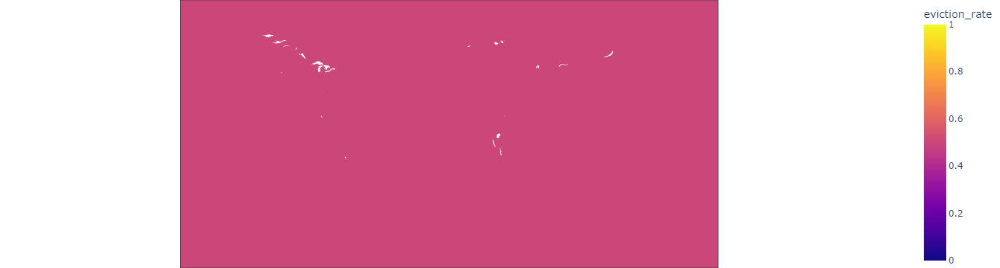

<IPython.core.display.Javascript object>

In [22]:
# Plotly choropleth
fig = px.choropleth(
    df_year_final,
    geojson=geoj,
    locations="census_tract_GEOID",
    color="eviction_rate",
    featureidkey="properties.census_tract_GEOID",
    labels={"avg-foreclosure-rate": "Eviction Rate"},
)
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

### Plotly Choropleth GeoJSON problem

This does not work because of an interesting problem as highlighted in https://stackoverflow.com/questions/61966708/plotly-express-choropleth-only-showing-some-information-from-geojson

The standard for GeoJSON defines a right hand rule which can break certain programs such as Plotly above. The choropleth in Plotly expects the GeoJSON to follow the right hand rule, which is why the choropleth breaks or gives weird colors if the GeoJSON is not in the required format. We use the [geojson_rewind](https://pypi.org/project/geojson-rewind/) library which is a Python port of Mapbox JS library to solve this as suggested in the StackOverFlow and GitHub Links

In [23]:
# !pip install geojson-rewind

<IPython.core.display.Javascript object>

In [24]:
from geojson_rewind import rewind

geoj = rewind(geoj, rfc7946=False)

<IPython.core.display.Javascript object>

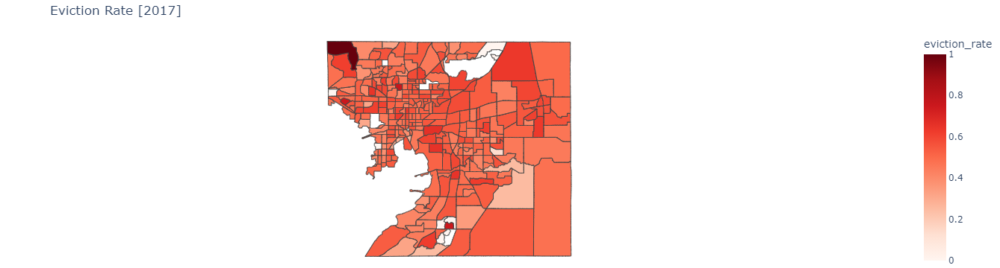

<IPython.core.display.Javascript object>

In [25]:
fig = px.choropleth(
    df_year_final[df_year_final.year == 2017],
    geojson=geoj,
    color="eviction_rate",
    color_continuous_scale="reds",
    locations="census_tract_GEOID",
    featureidkey="properties.census_tract_GEOID",
    hover_data=["eviction_filings", "year"],
)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    margin={"r": 0, "t": 40, "l": 0, "b": 0}, title_text="Eviction Rate [2017]",
)
fig.show()

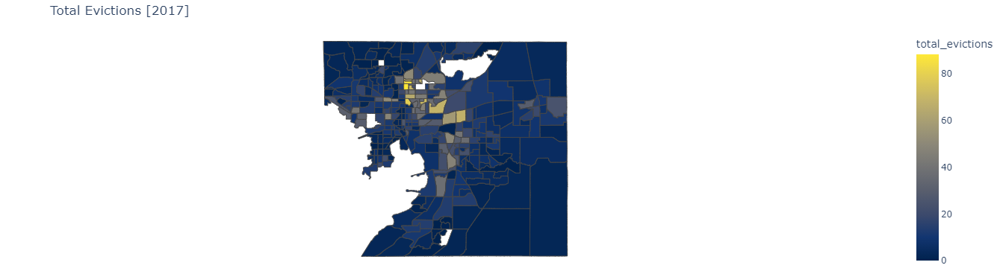

<IPython.core.display.Javascript object>

In [26]:
year_taken = 2017

fig = px.choropleth(
    df_year_final[df_year_final.year == year_taken],
    geojson=geoj,
    color="total_evictions",
    color_continuous_scale="cividis",
    locations="census_tract_GEOID",
    featureidkey="properties.census_tract_GEOID",
    hover_data=["eviction_filings", "year"],
)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
    title_text=f"Total Evictions [{year_taken}]",
)
fig.show()

### Using Widgets to make them more dynamic

In [27]:
import ipywidgets as widgets
from IPython.display import display

<IPython.core.display.Javascript object>

In [28]:
def choro_interactive(year, column):
    fig = px.choropleth(
        df_year_final[df_year_final.year == year],
        geojson=geoj,
        color=column,
        locations="census_tract_GEOID",
        featureidkey="properties.census_tract_GEOID",
        hover_data=["eviction_filings", "year"],
    )
    fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(
        margin={"r": 0, "t": 40, "l": 0, "b": 0}, title_text=f"{column} [{year}]",
    )
    fig.show()

<IPython.core.display.Javascript object>

In [29]:
display(widgets.interact(choro_interactive, year=[2017, 2018, 2019], column=values))

interactive(children=(Dropdown(description='year', options=(2017, 2018, 2019), value=2017), Dropdown(descripti…

<function __main__.choro_interactive(year, column)>

<IPython.core.display.Javascript object>

### Mapbox based

These are more responsive and better performant

In [42]:
# A default argument changes the default value of the widget
def choro_interactive_mapbox(year, column="eviction_filings"):
    fig = px.choropleth_mapbox(
        df_year_final[df_year_final.year == year],
        geojson=geoj,
        color=column,
        color_continuous_scale="viridis",
        locations="census_tract_GEOID",
        featureidkey="properties.census_tract_GEOID",
        mapbox_style="carto-positron",
        hover_data=["eviction_filings", "eviction_rate"],
    )

    fig.update_layout(
        margin={"r": 0, "t": 0, "l": 0, "b": 0},
        mapbox_zoom=8,
        mapbox_center={"lat": 27.924894, "lon": -82.569520},
    )
    display(fig)


display(
    widgets.interact(choro_interactive_mapbox, year=[2017, 2018, 2019], column=values)
)

interactive(children=(Dropdown(description='year', options=(2017, 2018, 2019), value=2017), Dropdown(descripti…

<function __main__.choro_interactive_mapbox(year, column='eviction_filings')>

<IPython.core.display.Javascript object>

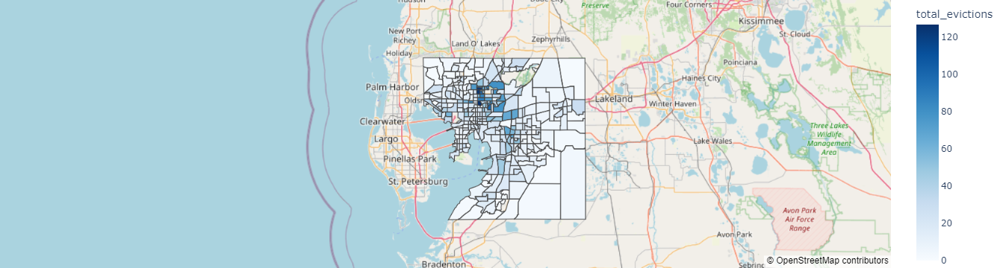

<IPython.core.display.Javascript object>

In [46]:
# For PDF, since vizes do not get export when used with widgets

fig = px.choropleth_mapbox(
    df_year_final[df_year_final.year == 2019],
    geojson=geoj,
    color="total_evictions",
    color_continuous_scale="blues",
    locations="census_tract_GEOID",
    featureidkey="properties.census_tract_GEOID",
    mapbox_style="open-street-map",
    hover_data=["eviction_filings", "eviction_rate"],
)

fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox_zoom=8,
    mapbox_center={"lat": 27.924894, "lon": -82.569520},
)
display(fig)

### Tableau

Similar Visualizations were explored using Tableau as shown:

![image.png](Tableau%20Output%201.png)

![image.png](Tableau%20Output%202.png)

## Get Versions

In [ ]:
# import geojson_rewind
# import pandas as pd
# import numpy as np
# import matplotlib
# import plotly
# import json
# import ipywidgets

# ls_ver = [pd, np, matplotlib, plotly, json, ipywidgets]

In [ ]:
# for i in ls_ver:
#     print(i, i.__version__)

In [ ]:
from importlib.metadata import version

version("geojson_rewind")

In [ ]:
import sys

sys.version

In [ ]:
import jupyterlab

jupyterlab.__version__

### Learnings

- nbconvert to pdf -> ensure that images in markdown have a URL like path as shown above for Tableau. [Ref](https://github.com/jupyter/nbconvert/issues/699)